<a href="https://colab.research.google.com/github/tmj1432/Capstone-Deep-Learning-/blob/main/Capstone_Phase_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Capstone : Phase 1

In this notebook, we will be building our own custom CNN model using a dataset consisting pictures of my own face. This model will be trained on four facial expressions (Angry, Sad, Neutral and Happy). 

---

##Mount Google Drive

In [137]:
 from google.colab import drive
 
 drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


---

##Import Libraries

In [138]:
# pip install keract

In [190]:
import tensorflow as tf
import cv2
import sys
import os
import matplotlib.pyplot as plt
import numpy as np
import random

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras import activations
from keras.models import load_model

from keract import get_activations, display_heatmaps, display_activations

---

###Function to Crop Face

As pictures are taken from my iPhone, it is not grayscaled or cropped at my face. The function below helps to grayscale and crop pictures.

In [140]:
def detectFaceOpenCVHaar(framepath, inHeight=300, inWidth=0):
    frame = cv2.imread(framepath)
    frameOpenCVHaar = frame.copy()
    frameHeight = frameOpenCVHaar.shape[0]
    frameWidth = frameOpenCVHaar.shape[1]
    if not inWidth:
        inWidth = int((frameWidth / frameHeight) * inHeight)

    scaleHeight = frameHeight / inHeight
    scaleWidth = frameWidth / inWidth

    frameOpenCVHaarSmall = cv2.resize(frameOpenCVHaar, (inWidth, inHeight))
    frameGray = cv2.cvtColor(frameOpenCVHaarSmall, cv2.COLOR_BGR2GRAY)

    faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    faces = faceCascade.detectMultiScale(frameGray)
    bboxes = []
    for (x, y, w, h) in faces:
        x1 = x
        y1 = y
        x2 = x + w
        y2 = y + h
        cvRect = [int(x1 * scaleWidth), int(y1 * scaleHeight),
                  int(x2 * scaleWidth), int(y2 * scaleHeight)]
        bboxes.append(cvRect)
        cv2.rectangle(frameOpenCVHaar, (cvRect[0], cvRect[1]), (cvRect[2], cvRect[3]), (0, 255, 0),
                      int(round(frameHeight / 150)), 4)
      
    cropped_image = frameOpenCVHaar[cvRect[1]:cvRect[3], cvRect[0]:cvRect[2]]
    cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)
    return cropped_image

In [141]:
def img_show(path):
  cropped = detectFaceOpenCVHaar(path)  
  plt.imshow(cropped, cmap="gray", vmin=0, vmax=255)

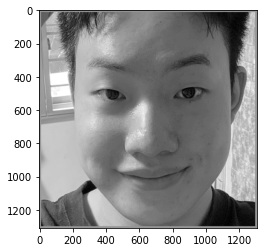

In [142]:
img_show('/content/gdrive/MyDrive/Colab Notebooks/Capstone/phase 1/train/happy/IMG_9468.JPG')

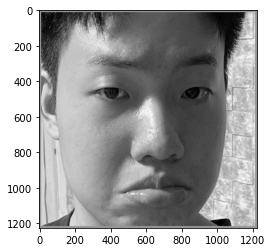

In [143]:
img_show('/content/gdrive/MyDrive/Colab Notebooks/Capstone/phase 1/train/sad/IMG_9847.JPG')

We can see that our cropping function is doing well.

---

##Image Pre-processing

In order for our model to interpret images, we have to process them accordingly.

###Create Train Data

In [144]:
def create_image_data(data,img_size, datadirectory, classes):
    for category in classes:
        path = os.path.join(datadirectory, category)
        class_num = classes.index(category)
        for img in os.listdir(path):
            try:
              #function to crop face
                img_array = detectFaceOpenCVHaar(os.path.join(path, img))
                new_array = cv2.resize(img_array, (img_size, img_size))
                data.append([new_array,class_num])
            except Exception as e:
                pass

In [145]:
# read all the images and convert them to array
training_data = [] 

# path
datadirectory_train = '/content/gdrive/MyDrive/Colab Notebooks/Capstone/phase 1/train' 

# classes
classes = ['angry','happy','neutral','sad']

# using pre-defined function 
create_image_data(training_data, 224, datadirectory_train, classes)

###Train-Validate Split

In [146]:
# shuffle training data 
random.Random(42).shuffle(training_data)

In [147]:
X = []
y = []

for features, label in training_data:
    X.append(features)
    y.append(label)

In [148]:
# X forms the training images, and y forms the training labels
X = np.array(X)
y = to_categorical(y)

In [149]:
# train-test split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [150]:
# Each image's dimension is 224 x 224
img_rows, img_cols = 224, 224
input_shape = (img_rows, img_cols, 1)

# Prepare the training images
X_train = X_train.reshape(X_train.shape[0], img_rows, img_cols, 1)
X_train = X_train.astype('float32')
X_train /= 255

# Prepare the validation images
X_val = X_val.reshape(X_val.shape[0], img_rows, img_cols, 1)
X_val = X_val.astype('float32')
X_val /= 255

###Create Test Data

In [151]:
# read all the images and convert them to array
testing_data = [] 

# path
datadirectory_test = '/content/gdrive/MyDrive/Colab Notebooks/Capstone/phase 1/test' 

# using pre-defined function 
create_image_data(testing_data, 224, datadirectory_test, classes)

In [152]:
# shuffle training data 
random.Random(42).shuffle(testing_data)

In [153]:
X_test = []
y_test = []

for features, label in testing_data:
    X_test.append(features)
    y_test.append(label)

In [154]:
# X forms the testing images, and y forms the testing labels
X_test = np.array(X_test)
y_test = to_categorical(y_test)

In [155]:
# Prepare the training images
X_test = X_test.reshape(X_test.shape[0], img_rows, img_cols, 1)
X_test = X_test.astype('float32')
X_test /= 255

---

##Modeling

In this section, we will be testing out between two models and two methods.

Model 1: using only 1 layer

Model 2: using 3 layers

Method 1: Without image augmentation

Method 2: With image augmentation

`Image augmentation` is a process of artificially increasing the amount of data by generating new data points from existing data. This includes adding minor alterations to data or using machine learning models to generate new data points in the latent space of original data to amplify the dataset.

###1 Layer

In [167]:
cnn1 = Sequential()
cnn1.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
cnn1.add(MaxPooling2D(pool_size=(2, 2)))
cnn1.add(Dropout(0.2))

cnn1.add(Flatten())

cnn1.add(Dense(64, activation='relu'))
cnn1.add(Dense(4, activation='softmax'))

cnn1.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

In [168]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

In [169]:
history1 = cnn1.fit(X_train, y_train,
          batch_size=32,
          epochs=50,
          verbose=1,
          validation_data=(X_val, y_val),
          callbacks=[callback])

Epoch 1/50
16/16 [==============================] - 1s 49ms/step - loss: 15.7274 - accuracy: 0.2539 - val_loss: 5.4663 - val_accuracy: 0.1875
Epoch 2/50
16/16 [==============================] - 1s 38ms/step - loss: 2.7932 - accuracy: 0.3307 - val_loss: 1.9519 - val_accuracy: 0.2891
Epoch 3/50
16/16 [==============================] - 1s 37ms/step - loss: 1.2486 - accuracy: 0.4724 - val_loss: 1.1462 - val_accuracy: 0.4297
Epoch 4/50
16/16 [==============================] - 1s 38ms/step - loss: 0.8613 - accuracy: 0.6811 - val_loss: 0.9809 - val_accuracy: 0.5859
Epoch 5/50
16/16 [==============================] - 1s 38ms/step - loss: 0.7013 - accuracy: 0.7618 - val_loss: 0.9028 - val_accuracy: 0.6016
Epoch 6/50
16/16 [==============================] - 1s 37ms/step - loss: 0.5381 - accuracy: 0.8602 - val_loss: 0.7983 - val_accuracy: 0.6875
Epoch 7/50
16/16 [==============================] - 1s 37ms/step - loss: 0.4023 - accuracy: 0.9291 - val_loss: 0.8090 - val_accuracy: 0.5938
Epoch 8/50
1

### Training Results

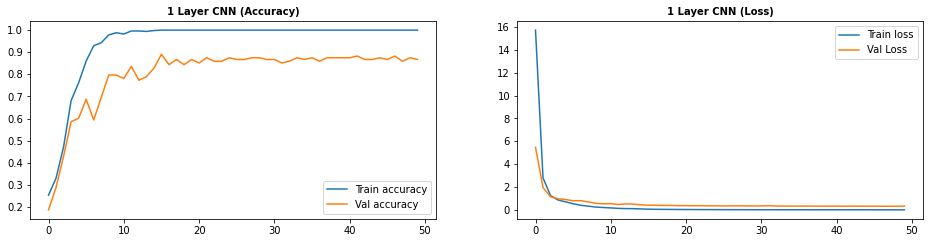

In [170]:
plt.figure(figsize=(16,8))

plt.subplot(2,2,1)
plt.plot(history1.history['accuracy'], label='Train accuracy')
plt.plot(history1.history['val_accuracy'], label='Val accuracy')
plt.legend()
plt.title('1 Layer CNN (Accuracy)', fontweight='bold', fontsize=10)

plt.subplot(2,2,2)
plt.plot(history1.history['loss'], label='Train loss')
plt.plot(history1.history['val_loss'], label='Val Loss')
plt.legend()
plt.title('1 Layer CNN (Loss)', fontweight='bold', fontsize=10);

In [171]:
score1 = cnn1.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score1[0])
print('Test accuracy:', score1[1])

Test loss: 1.5192017555236816
Test accuracy: 0.6836734414100647


From this, we can see that the test accuracy of this model is about 68% which is quite decent. Let us apply image augmentation to increase generalizability of our model.

In [172]:
cnn1.save('cnn1_phase1_pure')

###Image Augmentation

In [173]:
gen = ImageDataGenerator(horizontal_flip=True,
                         rotation_range=15)

batches = gen.flow(X_train, y_train, batch_size=32)
val_batches = gen.flow(X_val, y_val, batch_size=32)

In [174]:
history1 = cnn1.fit_generator(batches, epochs=50,
                    validation_data=val_batches, validation_steps=len(X_train)//32, use_multiprocessing=True, callbacks=[callback])

<ipython-input-174-87d7fab4057e>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history1 = cnn1.fit_generator(batches, epochs=50,


Epoch 1/50
16/16 [==============================] - 7s 416ms/step - loss: 1.6444 - accuracy: 0.5531 - val_loss: 1.0779 - val_accuracy: 0.5292
Epoch 2/50
16/16 [==============================] - 6s 392ms/step - loss: 0.9128 - accuracy: 0.6161 - val_loss: 0.9713 - val_accuracy: 0.5813
Epoch 3/50
16/16 [==============================] - 6s 384ms/step - loss: 0.8151 - accuracy: 0.7067 - val_loss: 0.8847 - val_accuracy: 0.6792
Epoch 4/50
16/16 [==============================] - 6s 383ms/step - loss: 0.7292 - accuracy: 0.7362 - val_loss: 0.9235 - val_accuracy: 0.6542
Epoch 5/50
16/16 [==============================] - 6s 391ms/step - loss: 0.6665 - accuracy: 0.7657 - val_loss: 0.7348 - val_accuracy: 0.7375
Epoch 6/50
16/16 [==============================] - 6s 397ms/step - loss: 0.6386 - accuracy: 0.7835 - val_loss: 0.7862 - val_accuracy: 0.7083
Epoch 7/50
16/16 [==============================] - 6s 393ms/step - loss: 0.5410 - accuracy: 0.8346 - val_loss: 0.6676 - val_accuracy: 0.7521
Epoch 

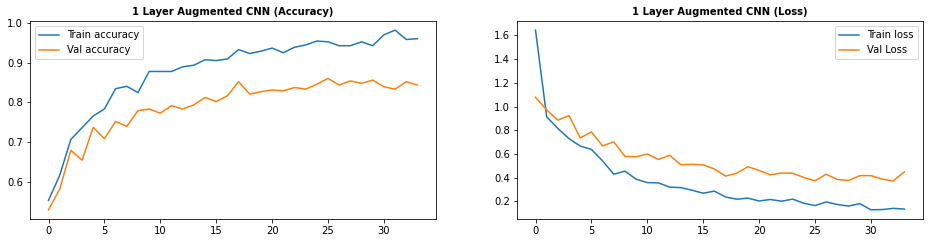

In [175]:
plt.figure(figsize=(16,8))

plt.subplot(2,2,1)
plt.plot(history1.history['accuracy'], label='Train accuracy')
plt.plot(history1.history['val_accuracy'], label='Val accuracy')
plt.legend()
plt.title('1 Layer Augmented CNN (Accuracy)', fontweight='bold', fontsize=10)

plt.subplot(2,2,2)
plt.plot(history1.history['loss'], label='Train loss')
plt.plot(history1.history['val_loss'], label='Val Loss')
plt.legend()
plt.title('1 Layer Augmented CNN (Loss)', fontweight='bold', fontsize=10);

In [176]:
score1 = cnn1.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score1[0])
print('Test accuracy:', score1[1])

Test loss: 0.9457138776779175
Test accuracy: 0.7653061151504517


We were able to increase our test accuracy from 68% to 76% which is a significant improvement. However, from the learning curves, there seem to be a little bit of overfitting. Let us see whether using a more complex model could help solve this issue.

In [178]:
cnn1.save('cnn1_phase1_augment')

###3 Layers

In [240]:
cnn3 = Sequential()
cnn3.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
cnn3.add(MaxPooling2D((2, 2)))
cnn3.add(Dropout(0.3))

cnn3.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
cnn3.add(MaxPooling2D(pool_size=(2, 2)))
cnn3.add(Dropout(0.2))

cnn3.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
cnn3.add(Dropout(0.2))

cnn3.add(Flatten())

cnn3.add(Dense(128, activation='relu'))
cnn3.add(Dropout(0.2))
cnn3.add(Dense(4, activation='softmax'))

cnn3.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

In [241]:
history3 = cnn3.fit(X_train, y_train,
          batch_size=32,
          epochs=50,
          verbose=1,
          validation_data=(X_val, y_val),
          callbacks=[callback])

Epoch 1/50
16/16 [==============================] - 2s 90ms/step - loss: 3.4063 - accuracy: 0.2480 - val_loss: 1.3865 - val_accuracy: 0.2656
Epoch 2/50
16/16 [==============================] - 1s 75ms/step - loss: 1.3803 - accuracy: 0.2717 - val_loss: 1.3633 - val_accuracy: 0.4688
Epoch 3/50
16/16 [==============================] - 1s 76ms/step - loss: 1.3292 - accuracy: 0.4035 - val_loss: 1.2458 - val_accuracy: 0.5469
Epoch 4/50
16/16 [==============================] - 1s 81ms/step - loss: 1.0800 - accuracy: 0.5472 - val_loss: 1.1212 - val_accuracy: 0.5156
Epoch 5/50
16/16 [==============================] - 1s 76ms/step - loss: 0.8738 - accuracy: 0.6319 - val_loss: 0.7072 - val_accuracy: 0.7188
Epoch 6/50
16/16 [==============================] - 1s 76ms/step - loss: 0.6120 - accuracy: 0.7835 - val_loss: 0.6877 - val_accuracy: 0.7344
Epoch 7/50
16/16 [==============================] - 1s 79ms/step - loss: 0.4924 - accuracy: 0.8189 - val_loss: 0.6076 - val_accuracy: 0.7578
Epoch 8/50
16

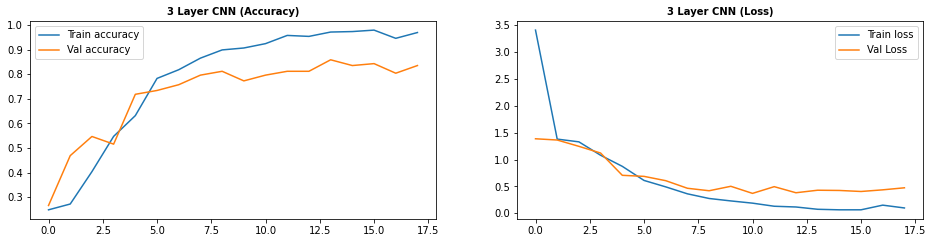

In [242]:
plt.figure(figsize=(16,8))

plt.subplot(2,2,1)
plt.plot(history3.history['accuracy'], label='Train accuracy')
plt.plot(history3.history['val_accuracy'], label='Val accuracy')
plt.legend()
plt.title('3 Layer CNN (Accuracy)', fontweight='bold', fontsize=10)

plt.subplot(2,2,2)
plt.plot(history3.history['loss'], label='Train loss')
plt.plot(history3.history['val_loss'], label='Val Loss')
plt.legend()
plt.title('3 Layer CNN (Loss)', fontweight='bold', fontsize=10);

In [243]:
score3 = cnn3.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score1[0])
print('Test accuracy:', score1[1])

Test loss: 0.9457138776779175
Test accuracy: 0.7653061151504517


Based on the test accuracy, we can see that by using a more complex model, we were able to get a higher test accuracy of 76% without any image augmentation. Let us apply image augmentation to this complex model to see whether we will get an even better test accuracy.

In [244]:
cnn1.save('cnn3_phase1')

###Image Augmentation

In [245]:
gen = ImageDataGenerator(horizontal_flip=True,
                         rotation_range=15)

batches = gen.flow(X_train, y_train, batch_size=32)
val_batches = gen.flow(X_val, y_val, batch_size=32)

In [246]:
history3 = cnn3.fit_generator(batches, epochs=50,
                    validation_data=val_batches, validation_steps=len(X_train)//32, use_multiprocessing=True,callbacks=[callback])

Epoch 1/50


<ipython-input-246-67949a8ce846>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history3 = cnn3.fit_generator(batches, epochs=50,


16/16 [==============================] - 9s 524ms/step - loss: 0.9850 - accuracy: 0.6535 - val_loss: 0.7903 - val_accuracy: 0.6625
Epoch 2/50
16/16 [==============================] - 6s 403ms/step - loss: 0.7089 - accuracy: 0.7146 - val_loss: 0.6800 - val_accuracy: 0.7271
Epoch 3/50
16/16 [==============================] - 7s 417ms/step - loss: 0.6430 - accuracy: 0.7323 - val_loss: 0.6000 - val_accuracy: 0.7417
Epoch 4/50
16/16 [==============================] - 8s 483ms/step - loss: 0.5588 - accuracy: 0.7953 - val_loss: 0.4778 - val_accuracy: 0.7958
Epoch 5/50
16/16 [==============================] - 7s 426ms/step - loss: 0.5228 - accuracy: 0.8031 - val_loss: 0.5275 - val_accuracy: 0.7771
Epoch 6/50
16/16 [==============================] - 6s 407ms/step - loss: 0.4664 - accuracy: 0.8228 - val_loss: 0.4261 - val_accuracy: 0.7979
Epoch 7/50
16/16 [==============================] - 7s 421ms/step - loss: 0.3723 - accuracy: 0.8701 - val_loss: 0.4428 - val_accuracy: 0.8000
Epoch 8/50
16/16 

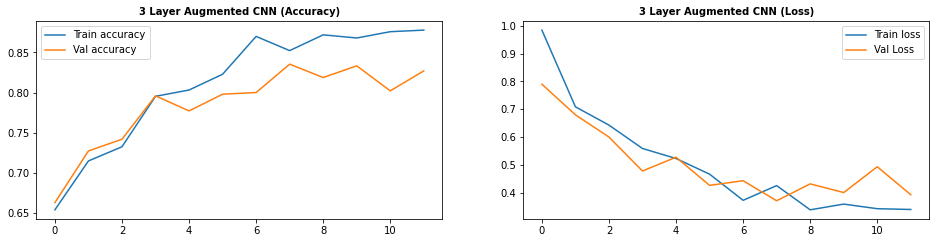

In [247]:
plt.figure(figsize=(16,8))

plt.subplot(2,2,1)
plt.plot(history3.history['accuracy'], label='Train accuracy')
plt.plot(history3.history['val_accuracy'], label='Val accuracy')
plt.legend()
plt.title('3 Layer Augmented CNN (Accuracy)', fontweight='bold', fontsize=10)

plt.subplot(2,2,2)
plt.plot(history3.history['loss'], label='Train loss')
plt.plot(history3.history['val_loss'], label='Val Loss')
plt.legend()
plt.title('3 Layer Augmented CNN (Loss)', fontweight='bold', fontsize=10);

After image augmentation, we can see that there is lesser overfitting through the learning curves. The train and val accuracy are both within the 0.1 threshold. 

In [248]:
score3 = cnn3.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score1[0])
print('Test accuracy:', score1[1])

Test loss: 0.9457138776779175
Test accuracy: 0.7653061151504517


We can see that even though we applied image augmentation, there was no improvement in our test accuracy. 

In [249]:
cnn1.save('cnn3_phase1_augment')

## Evaluate Best Model

|Model|Train Accuracy|Val Accuracy|Test Accuracy|
|---|---|---|---|
|CNN1|1|0.8672|0.6836|
|CNN1 Augmented|0.9606|0.8438|0.7653|
|CNN3|0.9705|0.8359|0.7653|
|CNN3 Augmented|0.8780|0.8271|0.7653|

Based on all the models, I would have to choose CNN3 Augmented. The reason behind this is that the model is not overfitted with the train and val accuracy within the 0.1 threshold while getting us a test accuracy of 0.7653. Another reason is that this model was also ran through the image augmentation algorithm which helps the generalizability of this model during deployment. 

### Load Best Model

In [250]:
# Input model of your choice
final_model = load_model('/content/gdrive/MyDrive/Colab Notebooks/Capstone/cnn3_phase1_augment')

###Making Predictions

In [252]:
# predict Y using CNN model on test data
y_pred = final_model.predict(X_test)

# predicted Y values is a normalised prob distr of values between 0 to 1 as a result of softmax activation function used

4/4 [==============================] - 0s 15ms/step


In [253]:
y_test =np.argmax(y_test, axis=1)
# use argmax to retrieve corresponding index for max value of each test sample
y_classes = [np.argmax(element) for element in y_pred]

### Classification Report

In [258]:
print("Classification Report: \n", classification_report(y_test, y_classes, target_names=['Angry',
                                                                                          'Happy',
                                                                                          'Neutral',
                                                                                          'Sad']))
# Better scores recorded on CNN as seen below as opposed to ANN as seen above

Classification Report: 
               precision    recall  f1-score   support

       Angry       0.74      0.67      0.70        21
       Happy       0.81      0.78      0.79        27
     Neutral       0.74      0.89      0.81        28
         Sad       0.79      0.68      0.73        22

    accuracy                           0.77        98
   macro avg       0.77      0.75      0.76        98
weighted avg       0.77      0.77      0.76        98



Let us look at the f1-score of the classification report. We can see that the model actually is not too bad. The f1 scores of all four emotions faired aboved 0.7

In [255]:
wrong_classified = np.nonzero(y_classes != y_test)[0]
correct_classified = np.nonzero(y_classes==y_test)[0]

In [267]:
print(f"Correctly classified {len(correct_classified)} Observations \n Wrongly Classified {len(wrong_classified)} Observations")

Correctly classified 75 Observations 
 Wrongly Classified 23 Observations


### Correctly Classified Images

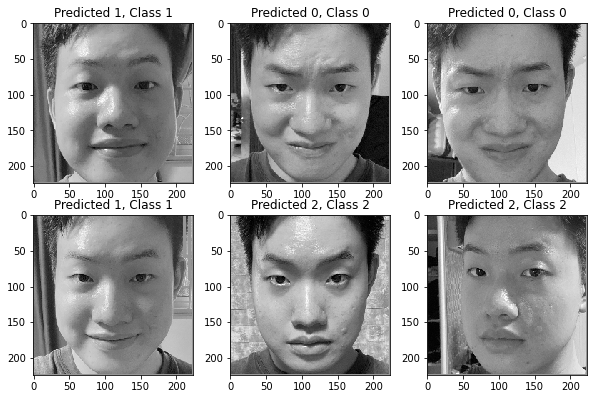

In [256]:
plt.figure(figsize=(10,10))
for i, correct in enumerate(correct_classified[42:48]):
    plt.subplot(3,3,i+1)
    plt.imshow(X_test[correct].reshape(224,224), cmap='gray', interpolation='none')
    plt.title("Predicted {}, Class {}".format(y_classes[correct], y_test[correct]))

### Wrongly Classified Images

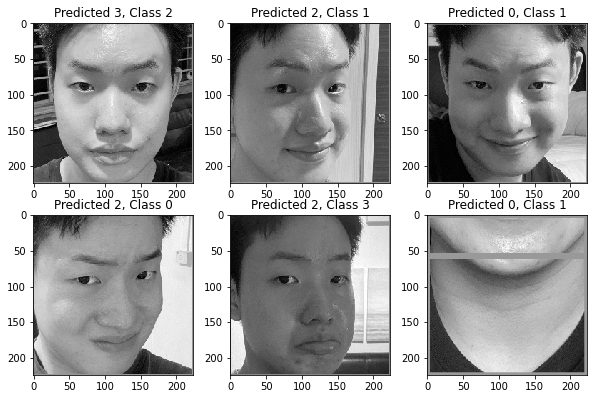

In [271]:
plt.figure(figsize=(10,10))
for i, incorrect in enumerate(wrong_classified[3:9]):
    plt.subplot(3,3,i+1)
    plt.imshow(X_test[incorrect].reshape(224,224), cmap='gray', interpolation='none')
    plt.title("Predicted {}, Class {}".format(y_classes[incorrect], y_test[incorrect]))

###Activations

conv2d_81_input (1, 224, 224, 1) 


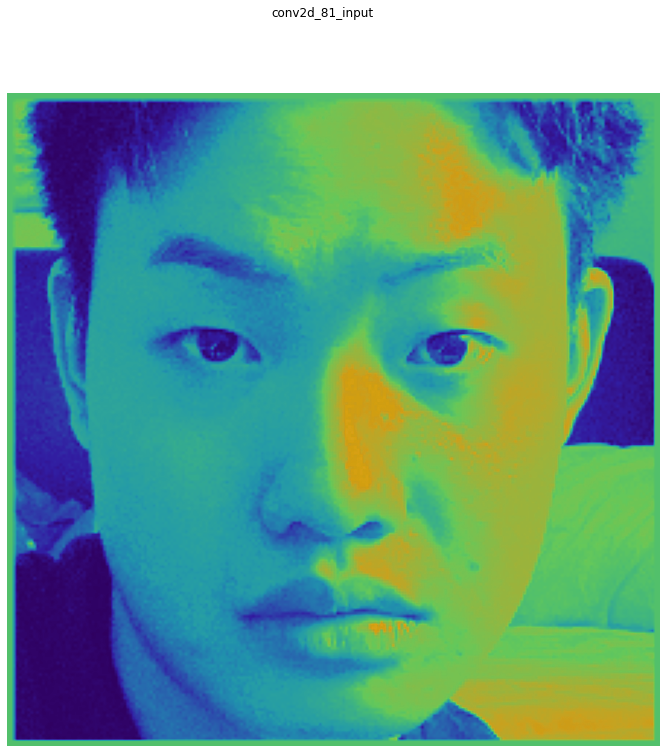

conv2d_81 (1, 222, 222, 32) 


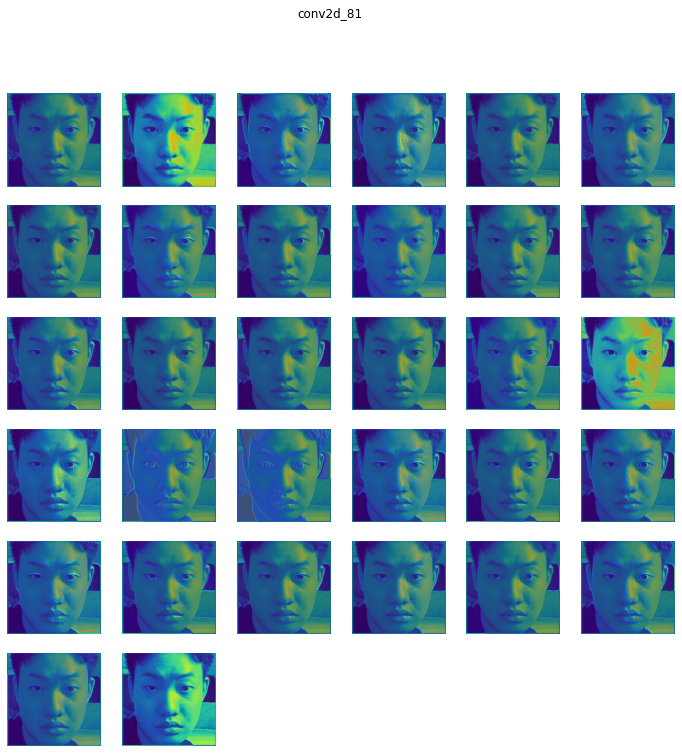

max_pooling2d_60 (1, 111, 111, 32) 


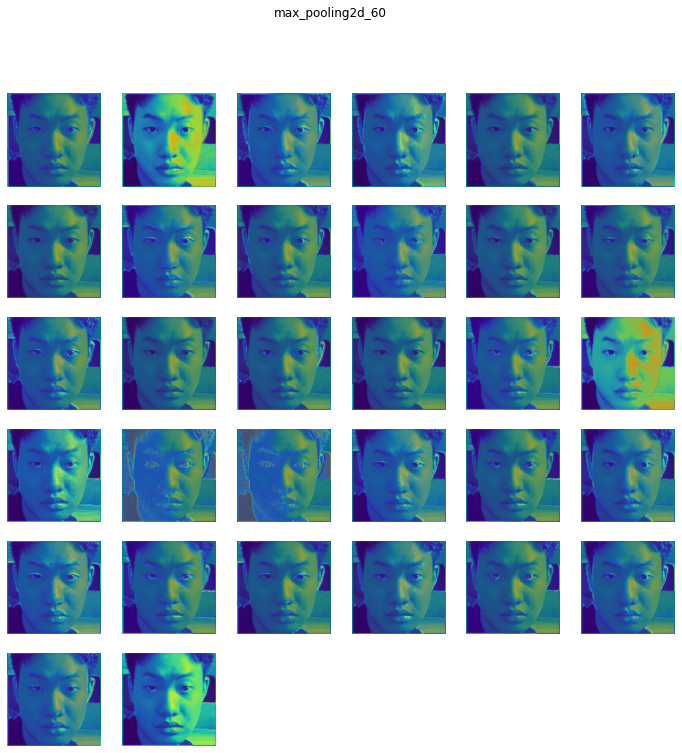

dropout_91 (1, 111, 111, 32) 


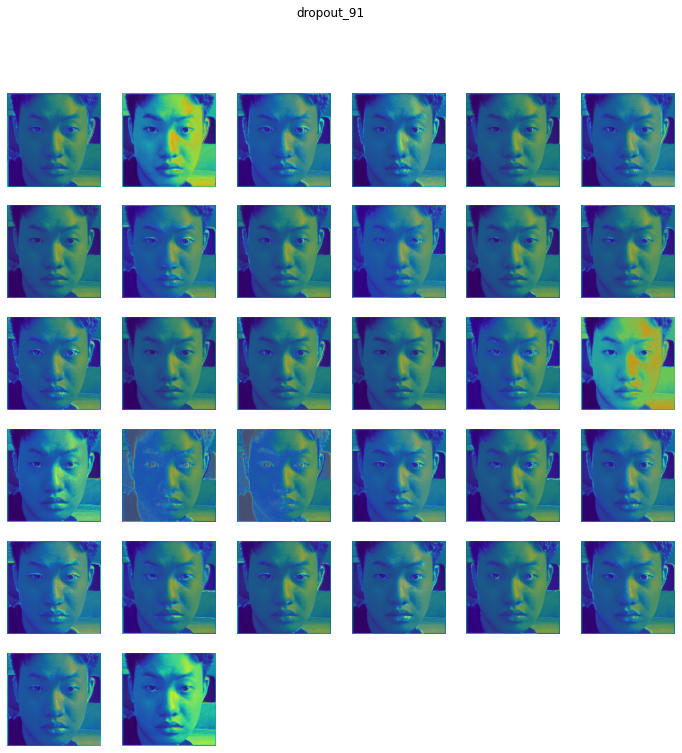

conv2d_82 (1, 109, 109, 64) 


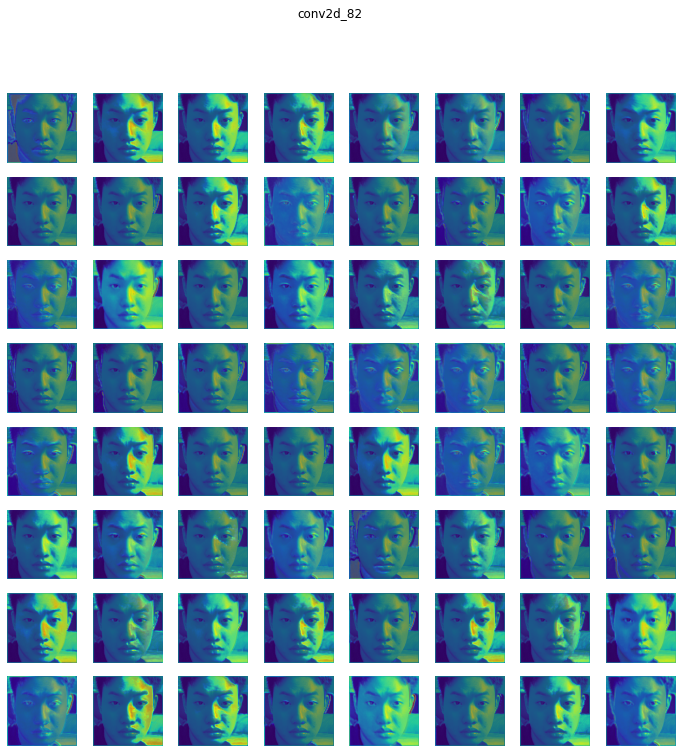

max_pooling2d_61 (1, 54, 54, 64) 


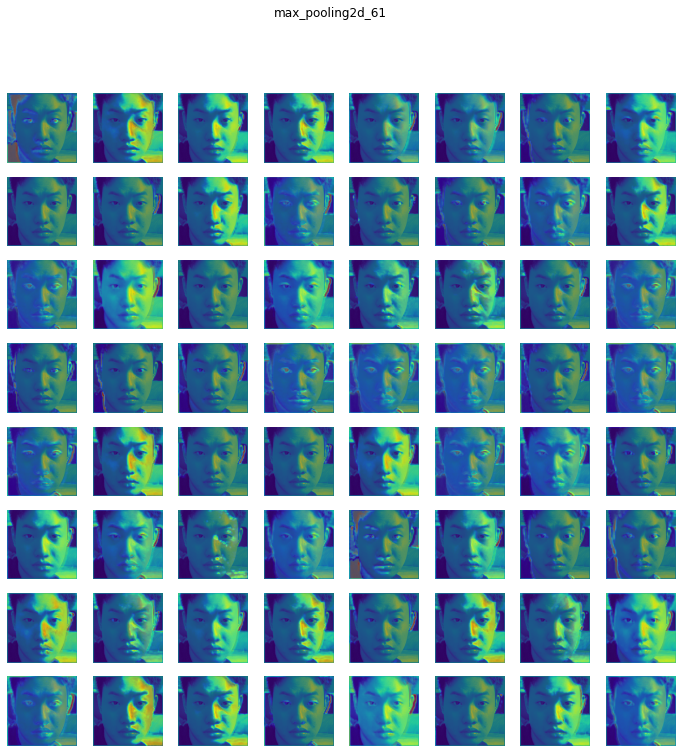

dropout_92 (1, 54, 54, 64) 


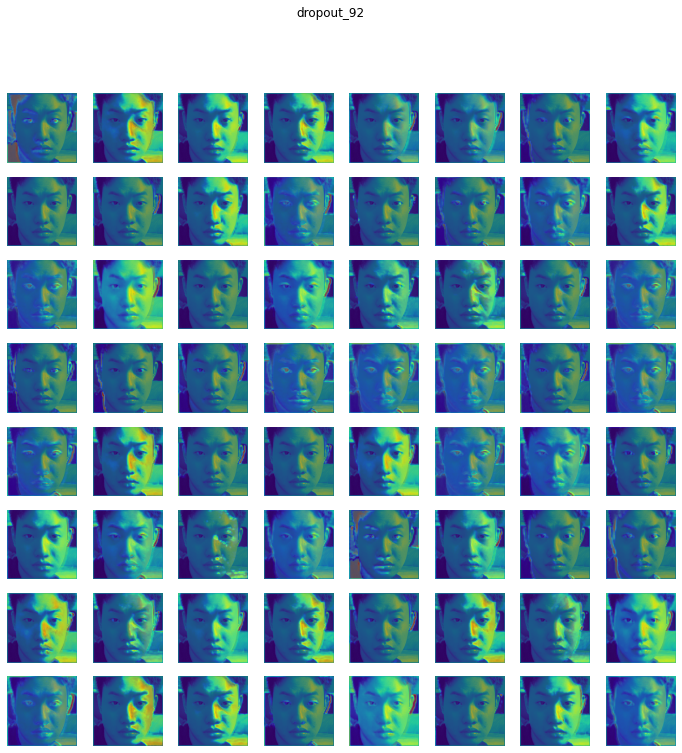

conv2d_83 (1, 52, 52, 128) 


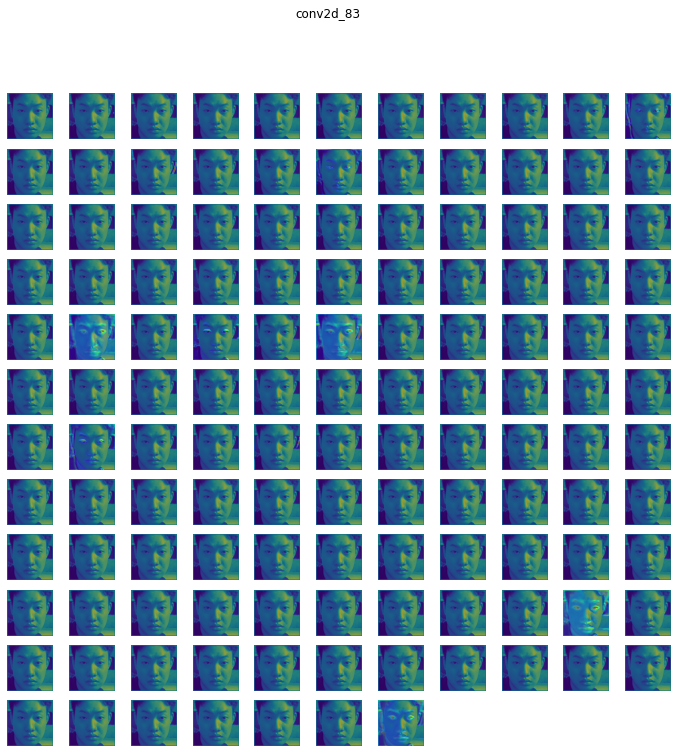

dropout_93 (1, 52, 52, 128) 


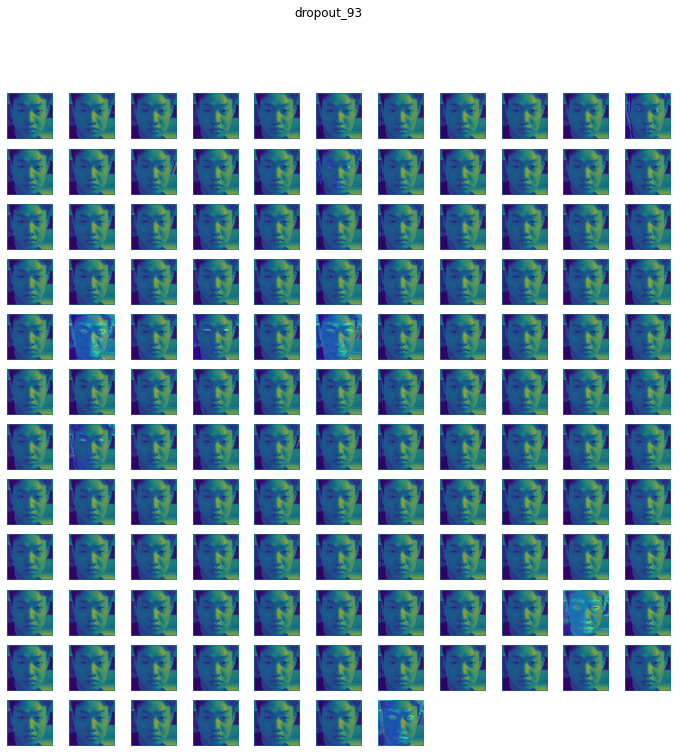

flatten_39 (1, 346112) -> Skipped. 2D Activations.
dense_78 (1, 128) -> Skipped. 2D Activations.
dropout_94 (1, 128) -> Skipped. 2D Activations.
dense_79 (1, 4) -> Skipped. 2D Activations.


In [274]:
keract_inputs = X_test[2:3]
keract_targets = y_test[:1]
activations = get_activations(cnn3, keract_inputs)
display_heatmaps(activations, keract_inputs, directory='.', save=False, fix=True, merge_filters=False)

conv2d_81_input (1, 224, 224, 1) 


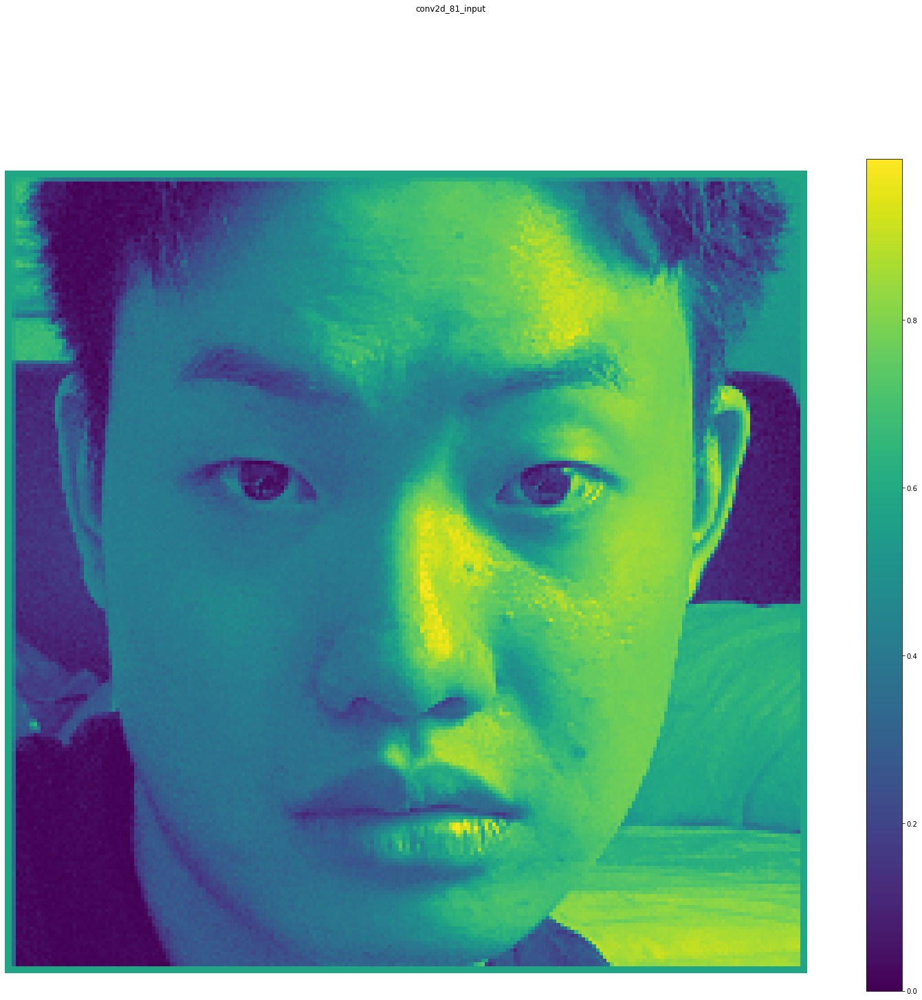

conv2d_81 (1, 222, 222, 32) 


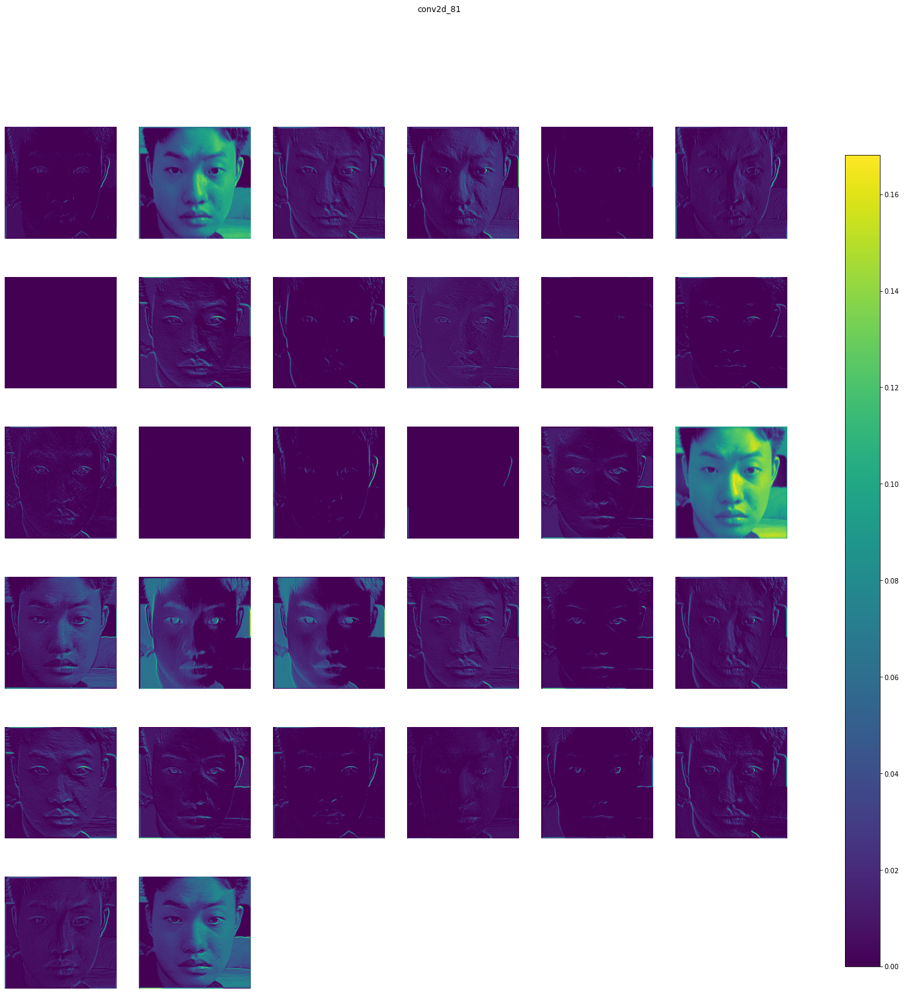

max_pooling2d_60 (1, 111, 111, 32) 


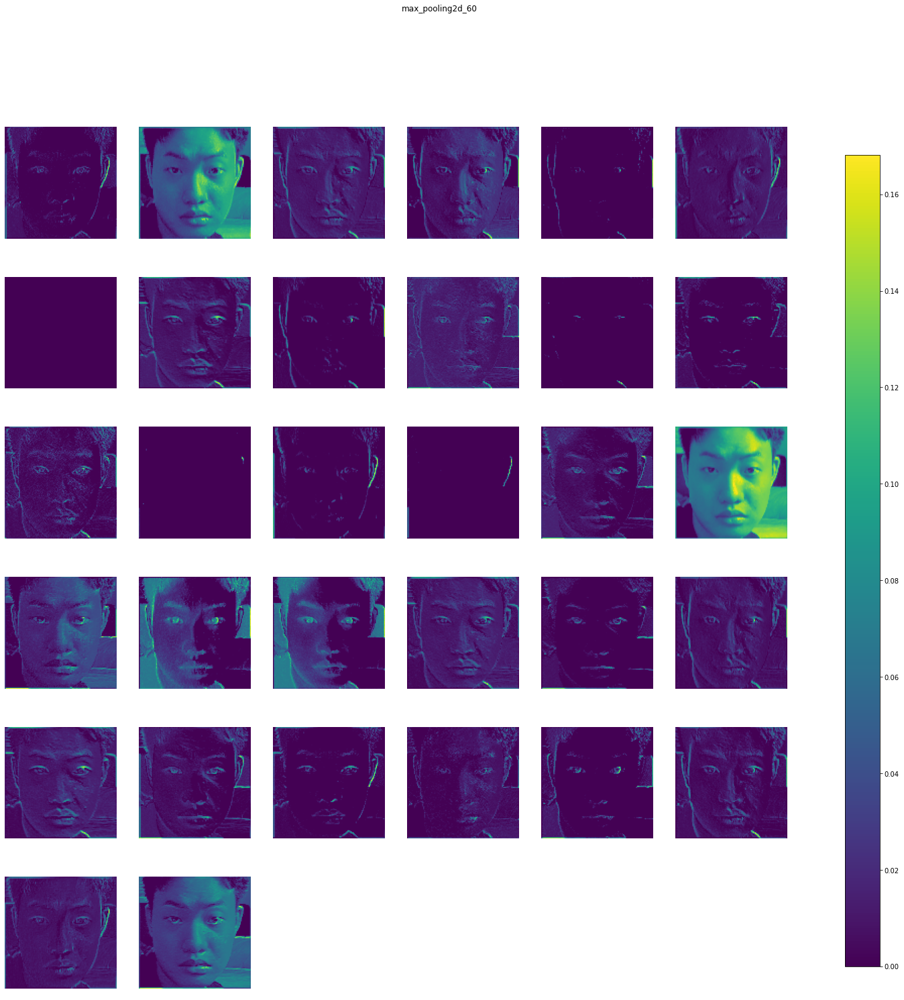

dropout_91 (1, 111, 111, 32) 


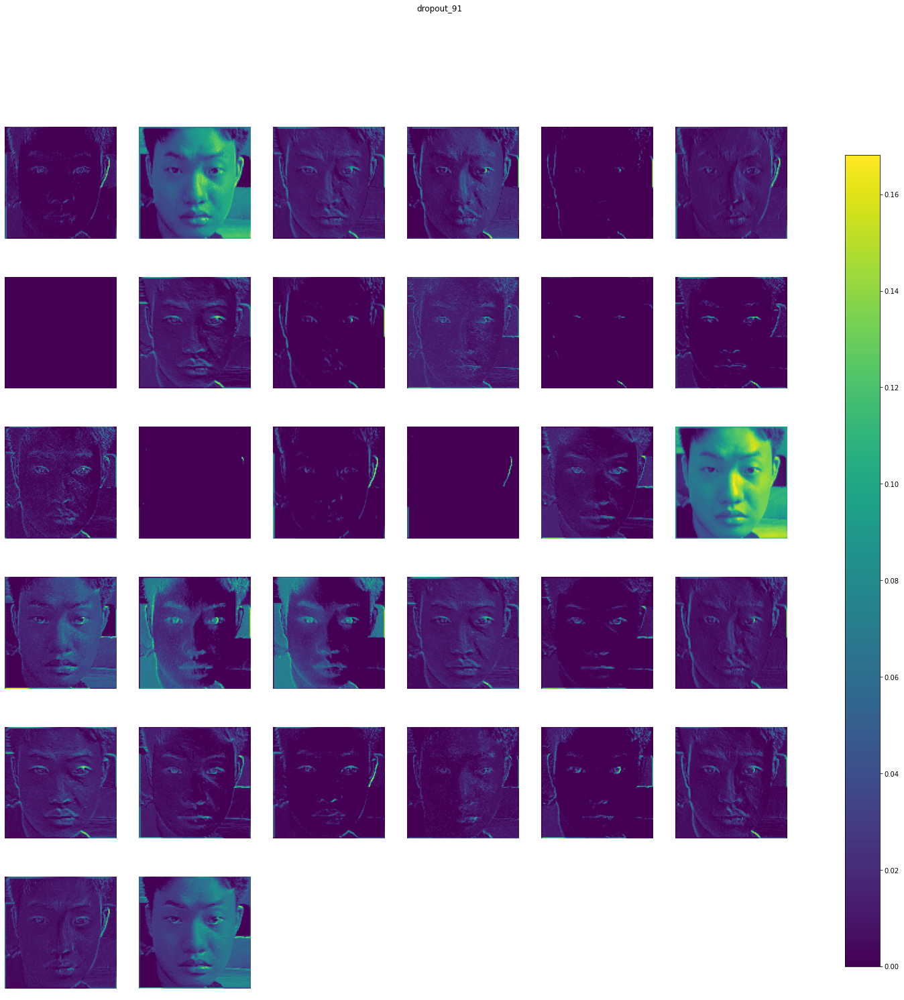

conv2d_82 (1, 109, 109, 64) 


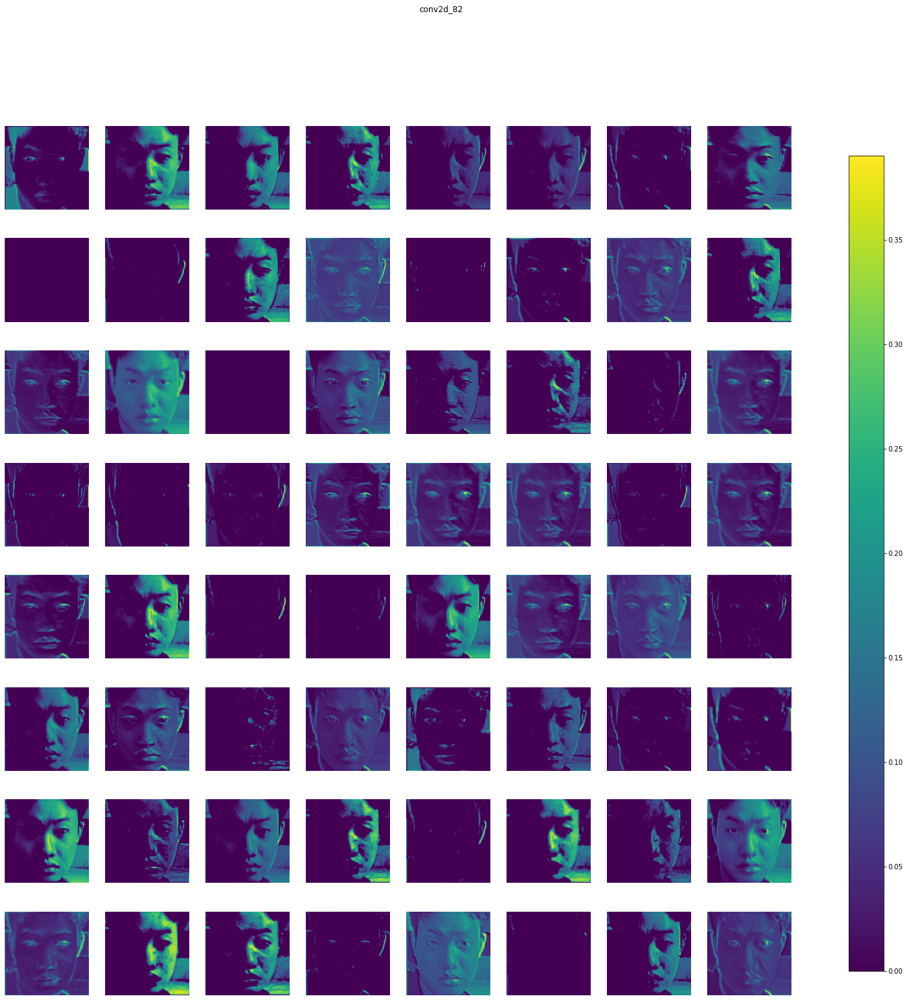

max_pooling2d_61 (1, 54, 54, 64) 


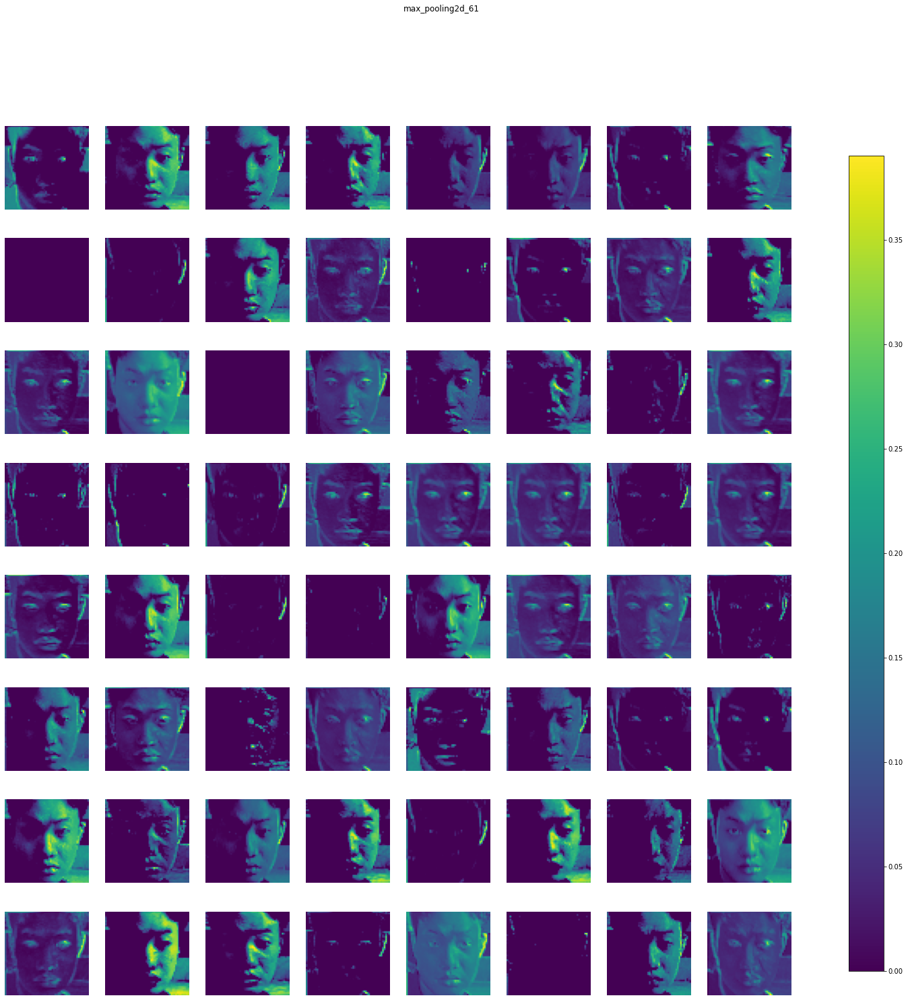

dropout_92 (1, 54, 54, 64) 


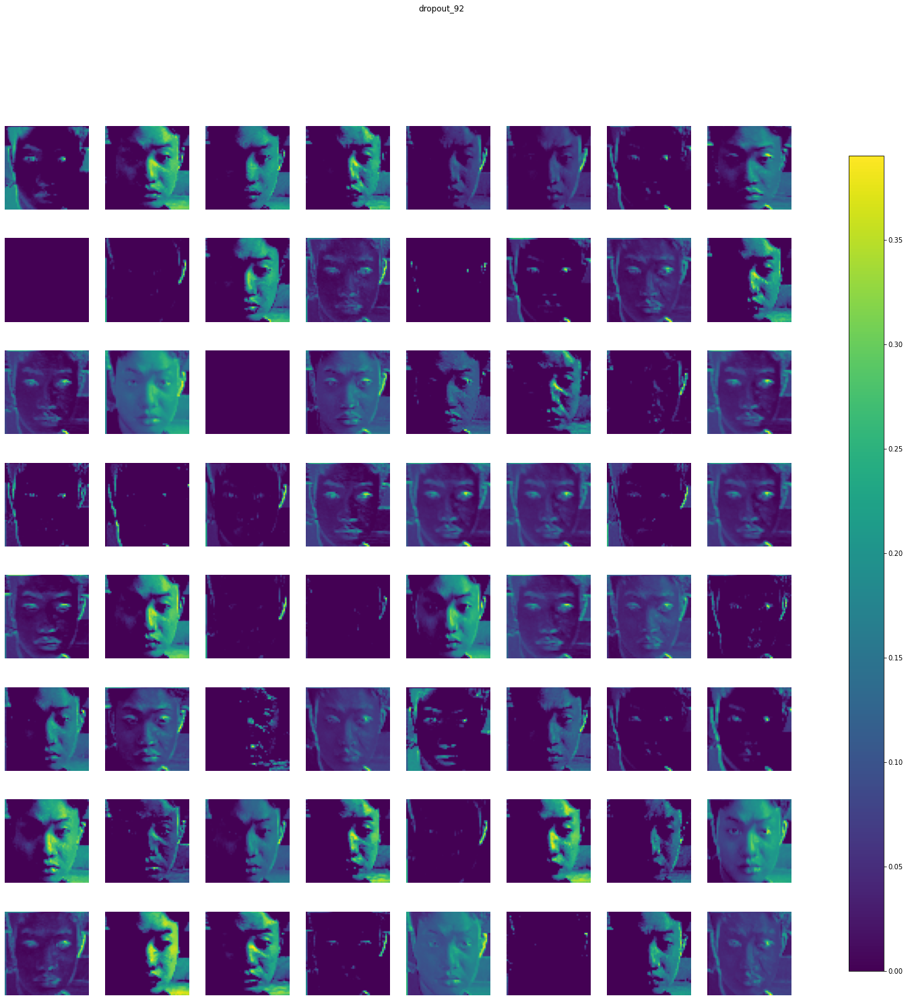

conv2d_83 (1, 52, 52, 128) 


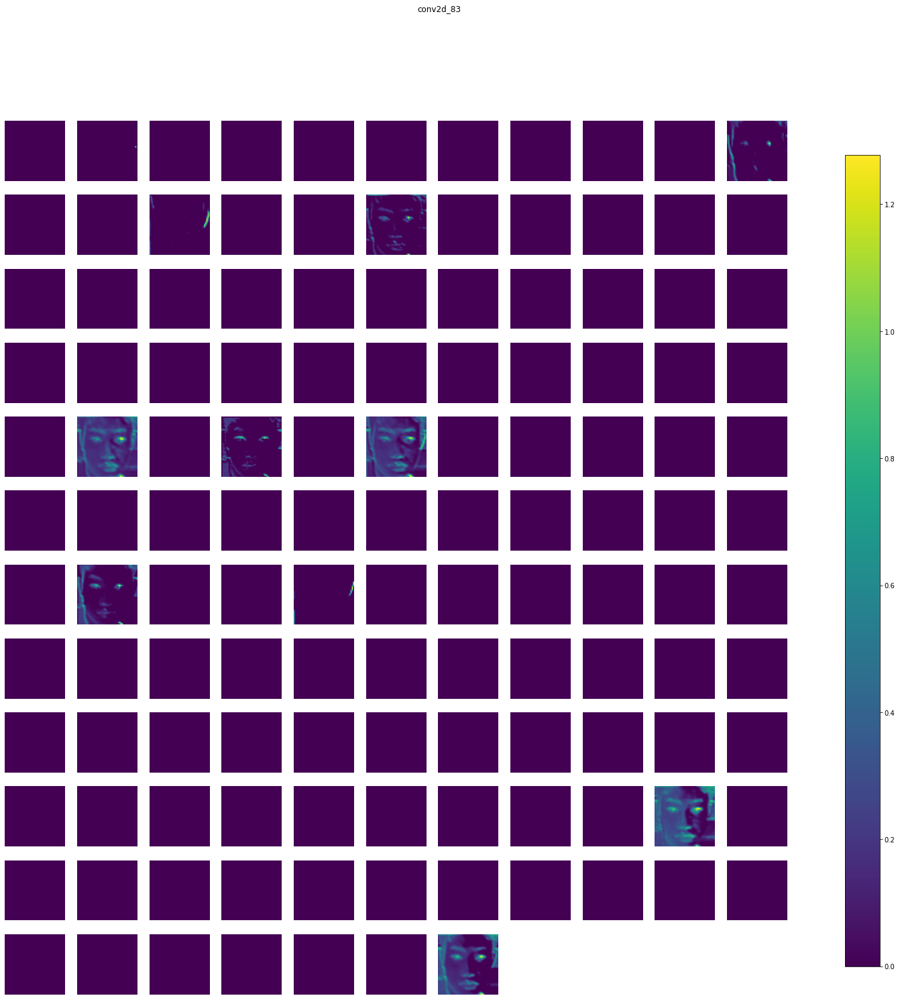

dropout_93 (1, 52, 52, 128) 


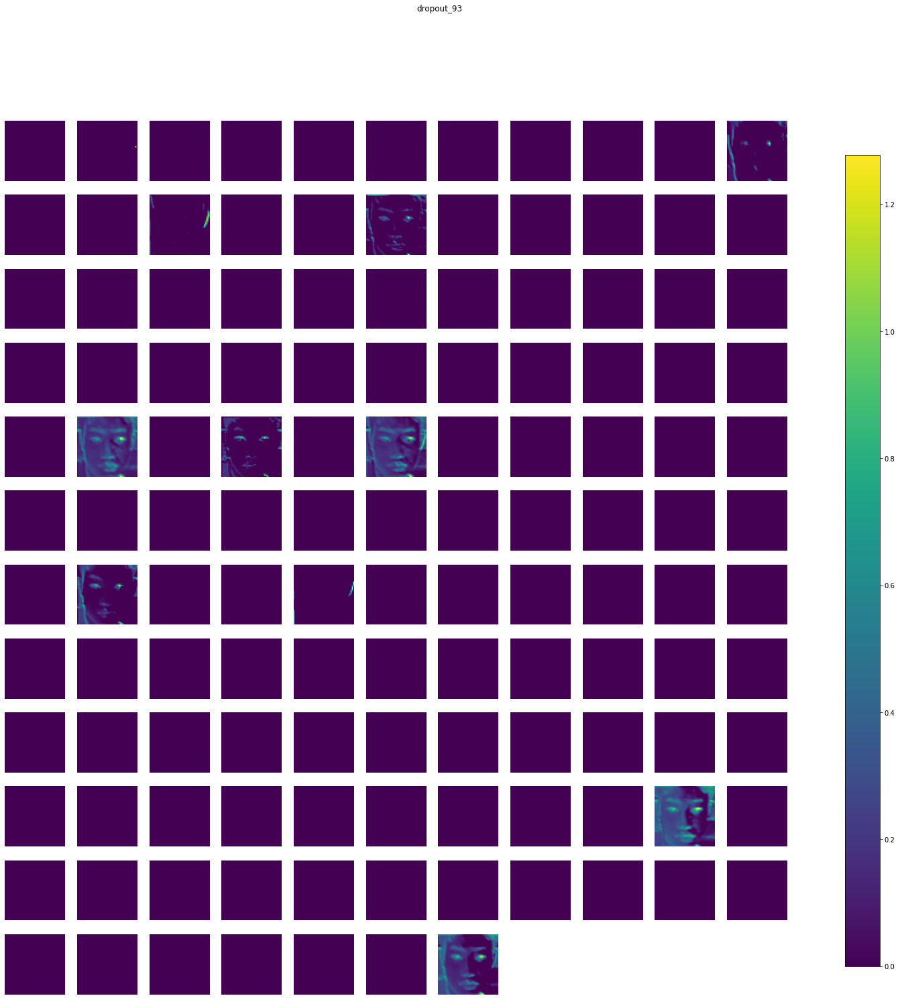

flatten_39 (1, 346112) 


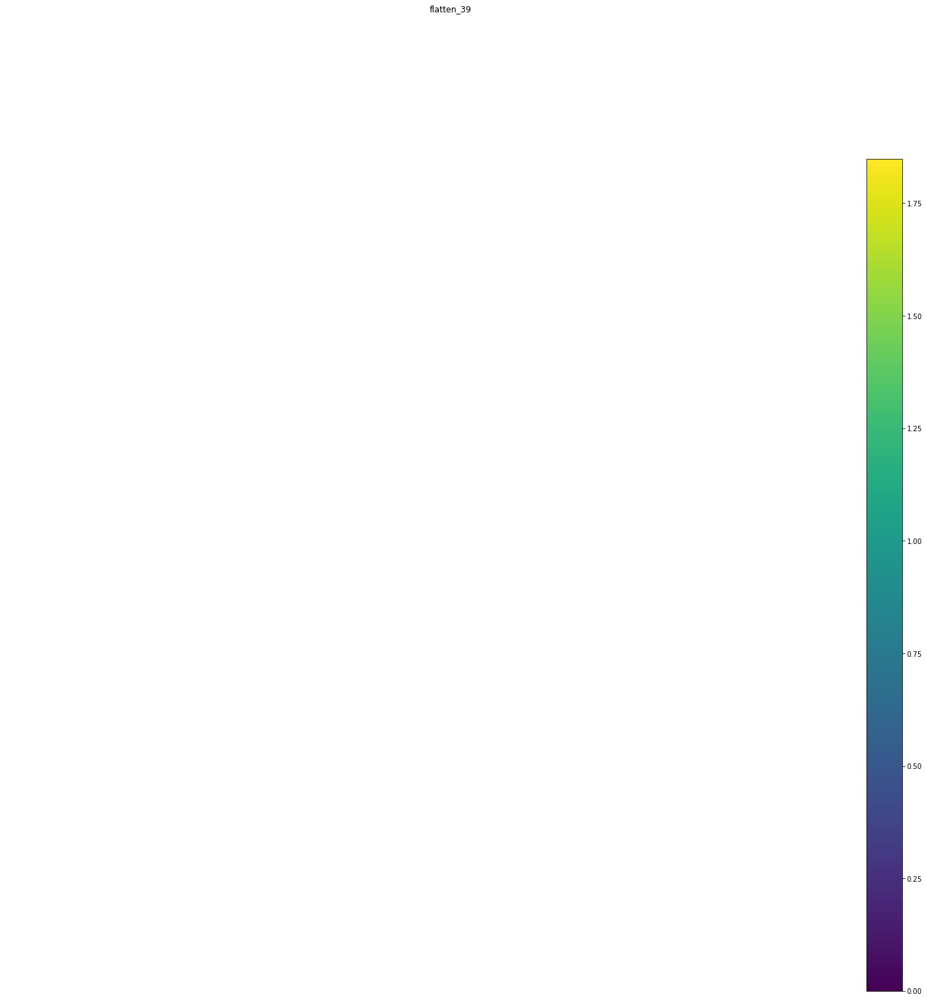

dense_78 (1, 128) 


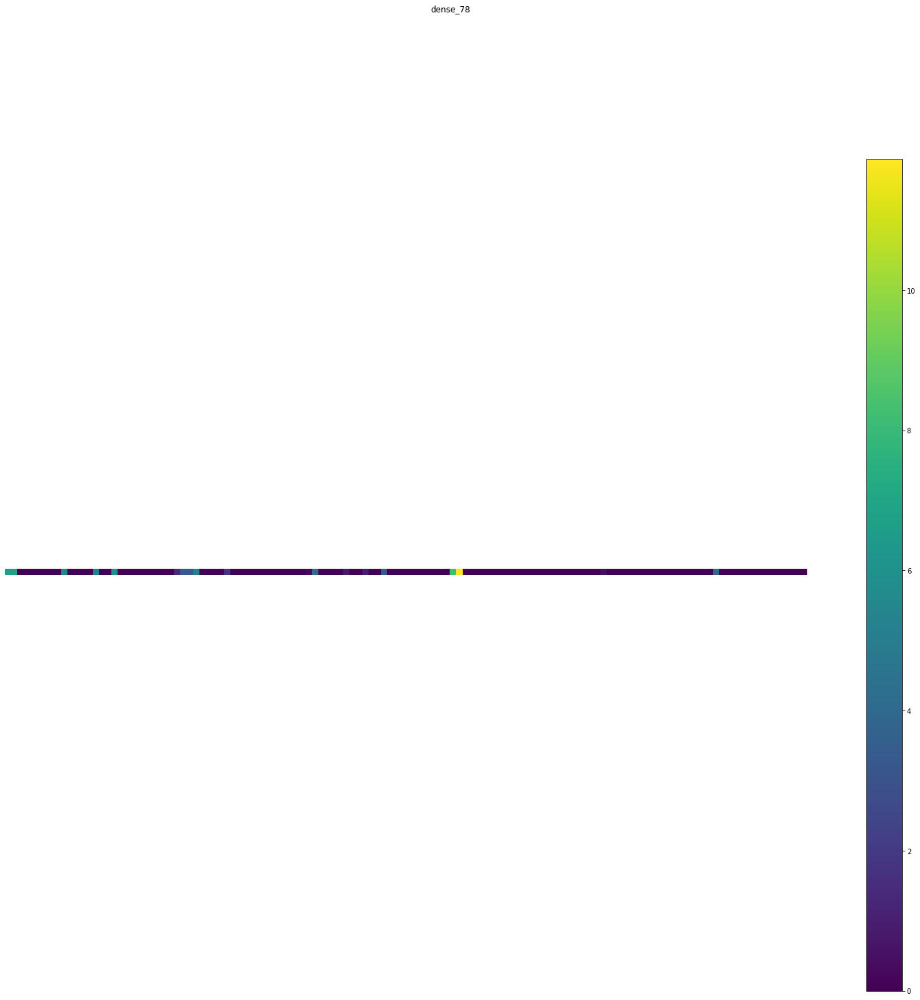

dropout_94 (1, 128) 


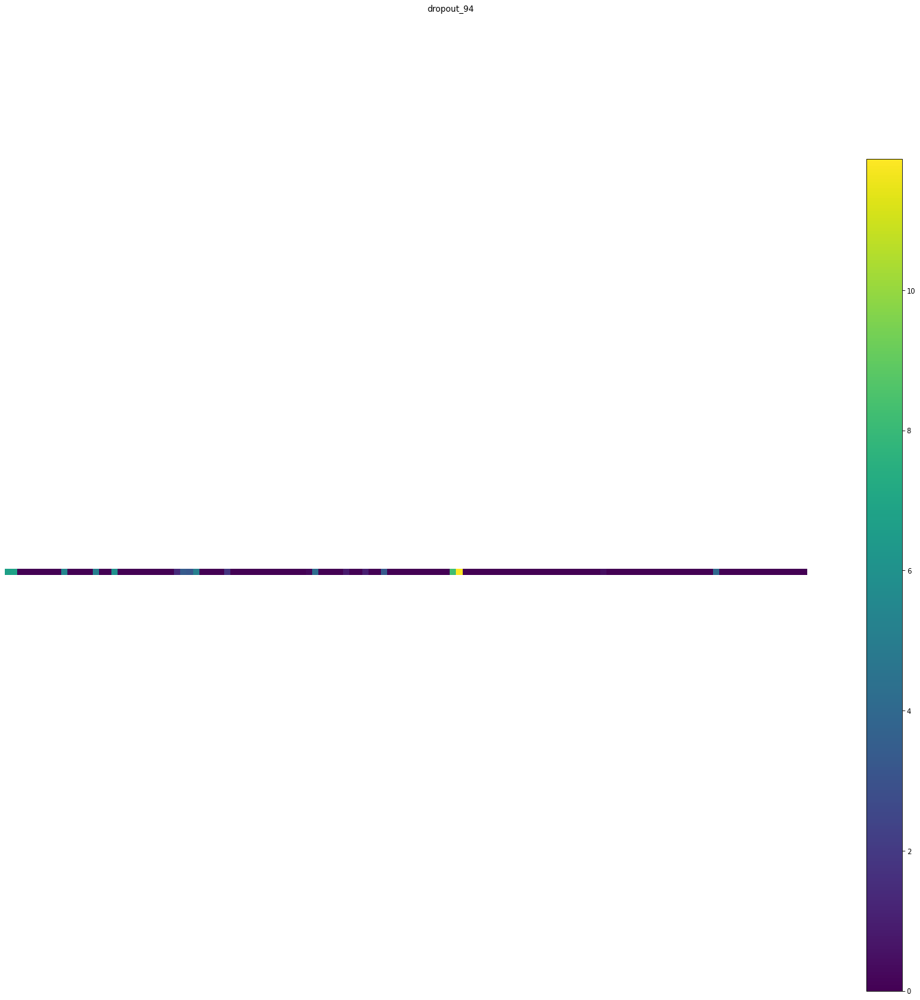

dense_79 (1, 4) 


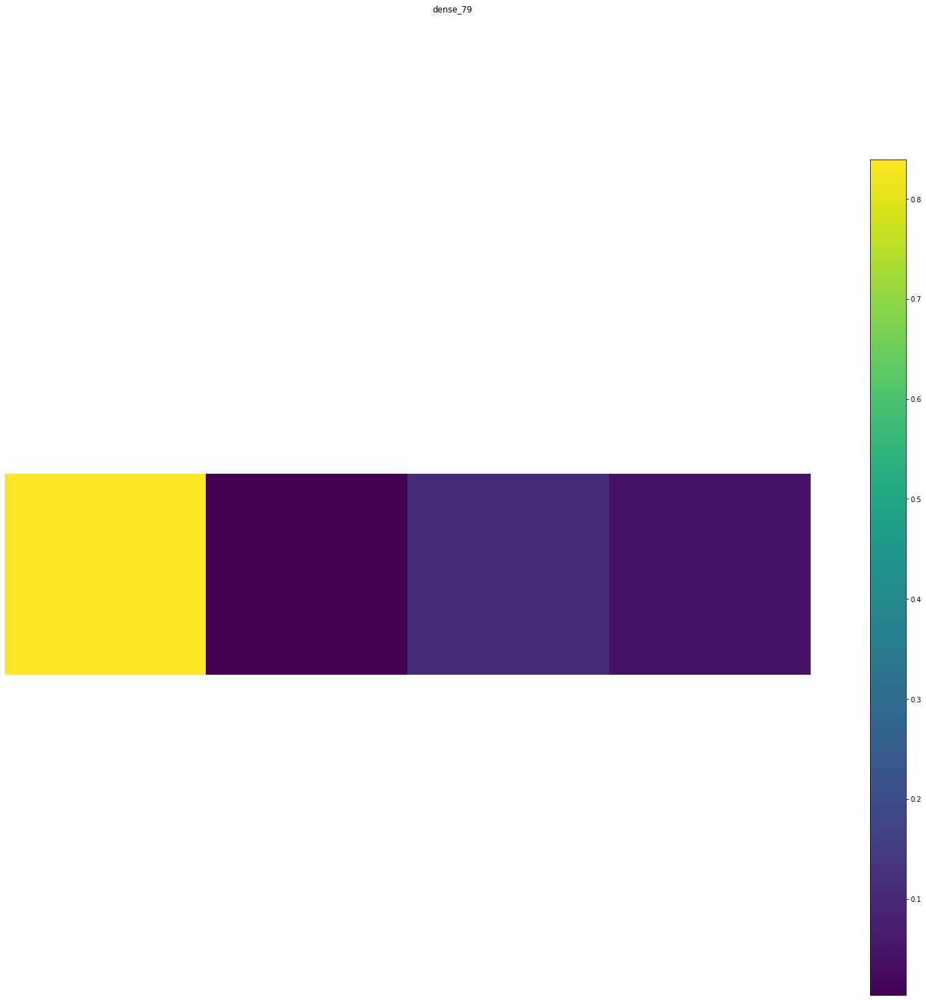

In [277]:
display_activations(activations=activations)

The activations visualises how images run through the model before prediction.